<a href="https://colab.research.google.com/github/kr-viku/GLAUCOMA_DETECTION/blob/master/Drishti_GS(U_Net)_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Here we have defined the U-NET model.

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import numpy as np 
import os
import skimage.io as io
import skimage.transform as trans
import numpy as np
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as keras


def unet(pretrained_weights = None ,input_size = (400,400,1)):
    inputs = Input(input_size)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
    conv1 = BatchNormalization()(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    conv2 = BatchNormalization()(conv2)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)
    conv2 = BatchNormalization()(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    conv3 = BatchNormalization()(conv3)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)
    conv3 = BatchNormalization()(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    conv4 = BatchNormalization()(conv4)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)
    conv4 = BatchNormalization()(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)#conv4

    conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
    conv5 = BatchNormalization()(conv5)
    conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5)
    conv5 = BatchNormalization()(conv5)
    drop5 = Dropout(0.5)(conv5)

    up6 = Conv2D(512, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(drop5))#conv5
    merge6 = concatenate([conv4,up6], axis = 3)#drop4
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)
    conv6 = BatchNormalization()(conv6)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6)
    conv6 = BatchNormalization()(conv6)

    up7 = Conv2D(256, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv6))
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)
    conv7 = BatchNormalization()(conv7)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7)
    conv7 = BatchNormalization()(conv7)

    up8 = Conv2D(128, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv7))
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)
    conv8 = BatchNormalization()(conv8)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8)
    conv8 = BatchNormalization()(conv8)

    up9 = Conv2D(64, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv8))
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
    conv9 = BatchNormalization()(conv9)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv9 = BatchNormalization()(conv9)
    conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv9 = BatchNormalization()(conv9)
    conv10 = Conv2D(1, 1, activation = 'sigmoid')(conv9)

    model = Model(input = inputs, output = conv10)

    model.compile(optimizer = Adam(lr = 1e-4), loss = 'binary_crossentropy', metrics = ['accuracy'])
    
    #model.summary()

    if(pretrained_weights):
    	model.load_weights(pretrained_weights)

    return model

Using TensorFlow backend.


Here are the helper functions. The use of the main functions are :-

1. trainGenerator() -> This is used for the training purpose.
2. testGenerator() -> This is used for the testing purpose.(num_image=51 is the number of testing data)
3. saveResult() -> This is used to save the predicted image in any specified locaion with any desired name.


In [0]:
from __future__ import print_function
from keras.preprocessing.image import ImageDataGenerator
import numpy as np 
import os
import glob
import skimage.io as io
import skimage.transform as trans
from skimage import img_as_ubyte

Sky = [128,128,128]
Building = [128,0,0]
Pole = [192,192,128]
Road = [128,64,128]
Pavement = [60,40,222]
Tree = [128,128,0]
SignSymbol = [192,128,128]
Fence = [64,64,128]
Car = [64,0,128]
Pedestrian = [64,64,0]
Bicyclist = [0,128,192]
Unlabelled = [0,0,0]

COLOR_DICT = np.array([Sky, Building, Pole, Road, Pavement,
                          Tree, SignSymbol, Fence, Car, Pedestrian, Bicyclist, Unlabelled])


def adjustData(img,mask,flag_multi_class,num_class):
    if(flag_multi_class):
        img = img / 255.
        mask = mask[:,:,:,0] if(len(mask.shape) == 4) else mask[:,:,0]
        new_mask = np.zeros(mask.shape + (num_class,))
        for i in range(num_class):
            #for one pixel in the image, find the class in mask and convert it into one-hot vector
            #index = np.where(mask == i)
            #index_mask = (index[0],index[1],index[2],np.zeros(len(index[0]),dtype = np.int64) + i) if (len(mask.shape) == 4) else (index[0],index[1],np.zeros(len(index[0]),dtype = np.int64) + i)
            #new_mask[index_mask] = 1
            new_mask[mask == i,i] = 1
        new_mask = np.reshape(new_mask,(new_mask.shape[0],new_mask.shape[1]*new_mask.shape[2],new_mask.shape[3])) if flag_multi_class else np.reshape(new_mask,(new_mask.shape[0]*new_mask.shape[1],new_mask.shape[2]))
        mask = new_mask
    elif(np.max(img) > 1):
        img = img / 255.
        mask = mask /255.
        mask[mask > 0.5] = 1
        mask[mask <= 0.5] = 0
    return (img,mask)



def trainGenerator(batch_size,train_path,image_folder,mask_folder,aug_dict,image_color_mode = "grayscale",
                    mask_color_mode = "grayscale",image_save_prefix  = "image",mask_save_prefix  = "mask",
                    flag_multi_class = False,num_class = 2,save_to_dir = None,target_size = (400,400),seed = 1):
    '''
    can generate image and mask at the same time
    use the same seed for image_datagen and mask_datagen to ensure the transformation for image and mask is the same
    if you want to visualize the results of generator, set save_to_dir = "your path"
    '''
    image_datagen = ImageDataGenerator(**aug_dict)
    mask_datagen = ImageDataGenerator(**aug_dict)
    image_generator = image_datagen.flow_from_directory(
        train_path,
        classes = [image_folder],
        class_mode = None,
        color_mode = image_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = image_save_prefix,
        seed = seed)
    mask_generator = mask_datagen.flow_from_directory(
        train_path,
        classes = [mask_folder],
        class_mode = None,
        color_mode = mask_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = mask_save_prefix,
        seed = seed)
    train_generator = zip(image_generator, mask_generator)
    for (img,mask) in train_generator:
        img,mask = adjustData(img,mask,flag_multi_class,num_class)
        yield (img,mask)



def testGenerator(test_path,num_image = 51,target_size = (400,400),flag_multi_class = False,as_gray = True):
    for i in range(num_image):
        img = io.imread(os.path.join(test_path,"%d.png"%(i+1)),as_gray = as_gray)
        #img = img / 255.
        img = trans.resize(img,target_size)
        img = np.reshape(img,img.shape+(1,)) if (not flag_multi_class) else img
        img = np.reshape(img,(1,)+img.shape)
        yield img


def geneTrainNpy(image_path,mask_path,flag_multi_class = False,num_class = 2,image_prefix = "image",mask_prefix = "mask",image_as_gray = True,mask_as_gray = True):
    image_name_arr = glob.glob(os.path.join(image_path,"%s*.png"%image_prefix))
    image_arr = []
    mask_arr = []
    for index,item in enumerate(image_name_arr):
        img = io.imread(item,as_gray = image_as_gray)
        img = np.reshape(img,img.shape + (1,)) if image_as_gray else img
        mask = io.imread(item.replace(image_path,mask_path).replace(image_prefix,mask_prefix),as_gray = mask_as_gray)
        mask = np.reshape(mask,mask.shape + (1,)) if mask_as_gray else mask
        img,mask = adjustData(img,mask,flag_multi_class,num_class)
        image_arr.append(img)
        mask_arr.append(mask)
    image_arr = np.array(image_arr)
    mask_arr = np.array(mask_arr)
    return image_arr,mask_arr

def labelVisualize(num_class,color_dict,img):
    img = img[:,:,0] if len(img.shape) == 3 else img
    img_out = np.zeros(img.shape + (3,))
    for i in range(num_class):
        img_out[img == i,:] = color_dict[i]
    return img_out / 255


def saveResult(save_path,npyfile,flag_multi_class = False,num_class = 2):
    for i,item in enumerate(npyfile):
        if flag_multi_class:
            img = labelVisualize(num_class,COLOR_DICT,item)
        else:
            img=item[:,:,0]
            #print(np.max(img),np.min(img))
            img[img>0.5]=1
            img[img<=0.5]=0
            #print(np.max(img),np.min(img))
            io.imsave(os.path.join(save_path,"%d.png"%(i+1)),img_as_ubyte(img))


In [0]:
data_gen_args = dict()
myGene = trainGenerator(4,'/content/drive/My Drive/GD/Training','Images','OD avg',data_gen_args,save_to_dir = None)
model = unet()
model_checkpoint = ModelCheckpoint('/content/drive/My Drive/Colab_Project/Weights/unet_membrane_15rd.hdf5', monitor='loss',verbose=1, save_best_only=True)
model.fit_generator(myGene,steps_per_epoch=175,epochs=15,callbacks=[model_checkpoint])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:74: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("co...)`


Epoch 1/15
Found 700 images belonging to 1 classes.
Found 700 images belonging to 1 classes.
175/175 [==============================] - 416s 2s/step - loss: 0.5876 - accuracy: 0.9641

Epoch 00001: loss improved from inf to 0.58756, saving model to /content/drive/My Drive/Colab_Project/Weights/unet_membrane_15rd.hdf5
Epoch 2/15
175/175 [==============================] - 407s 2s/step - loss: 0.5508 - accuracy: 0.9939

Epoch 00002: loss improved from 0.58756 to 0.55082, saving model to /content/drive/My Drive/Colab_Project/Weights/unet_membrane_15rd.hdf5
Epoch 3/15
175/175 [==============================] - 407s 2s/step - loss: 0.5258 - accuracy: 0.9957

Epoch 00003: loss improved from 0.55082 to 0.52583, saving model to /content/drive/My Drive/Colab_Project/Weights/unet_membrane_15rd.hdf5
Epoch 4/15
175/175 [==============================] - 407s 2s/step - loss: 0.4982 - accuracy: 0.9798

Epoch 00004: loss improved from 0.52583 to 0.49819, saving model to /content/drive/My Drive/Colab_Pr

Testing is done here for the Optic Disk.
1. Number of test data = 51

In [0]:
testGene = testGenerator("/content/drive/My Drive/GD/Testing/Images")
model = unet()
model.load_weights("/content/drive/My Drive/Colab_Project/Weights/unet_membrane_15rd.hdf5")
results = model.predict_generator(testGene,51,verbose=1)
#predicted_image_binary = results > 0.5
saveResult("/content/drive/My Drive/Colab_Project/pred_od",results)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:74: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("co...)`


51/51 [==============================] - 20s 400ms/step


Original data, Ground truth and the Predicted value of the Optic Disk are displayed side-wise for comparison.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


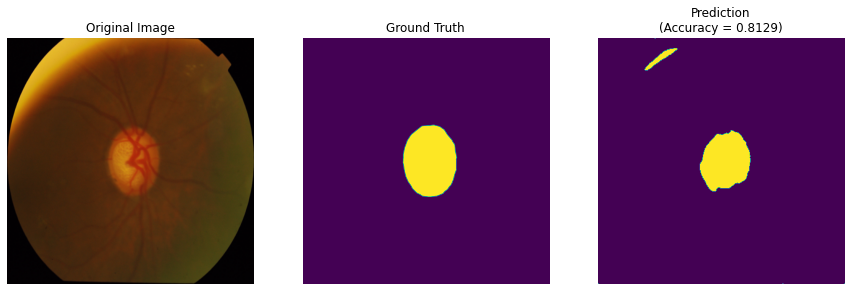

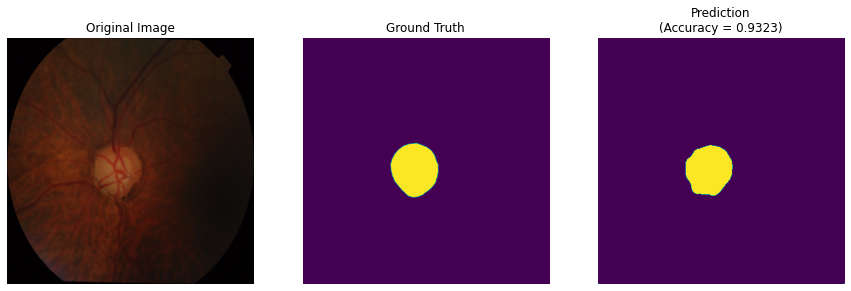

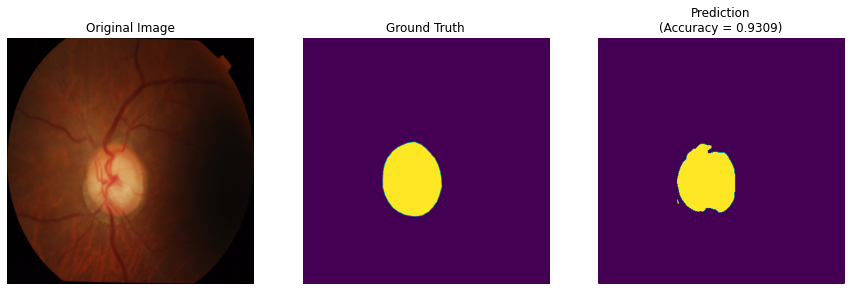

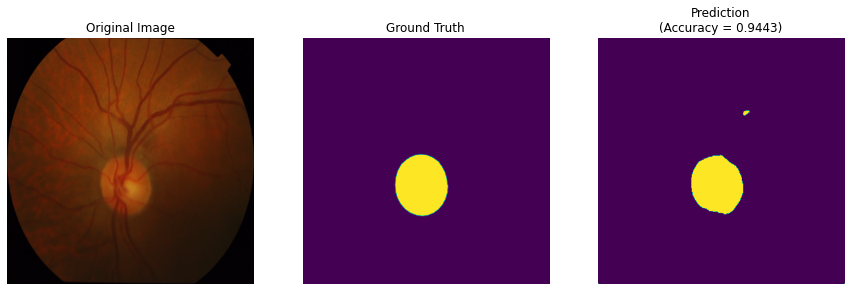

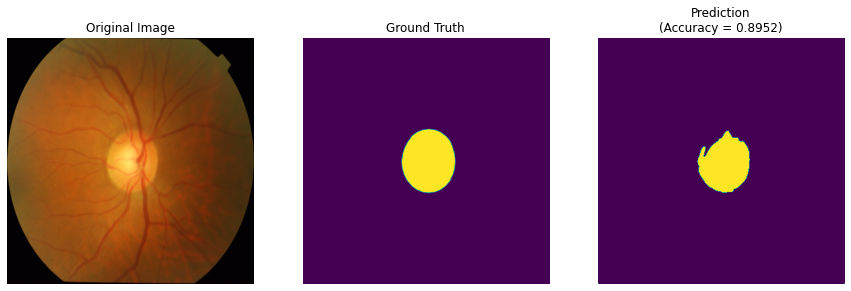

...

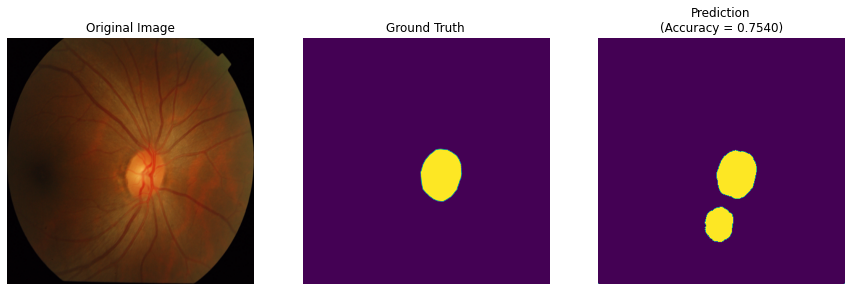

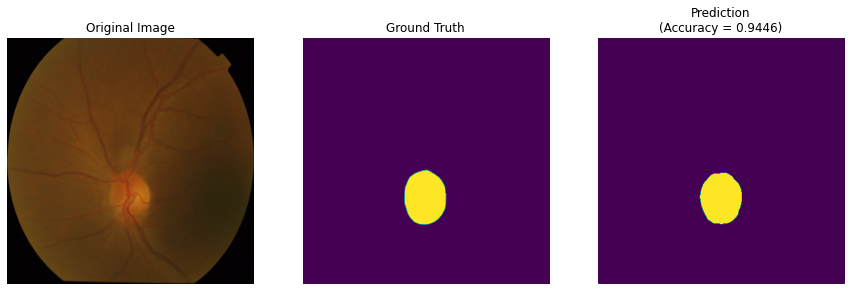

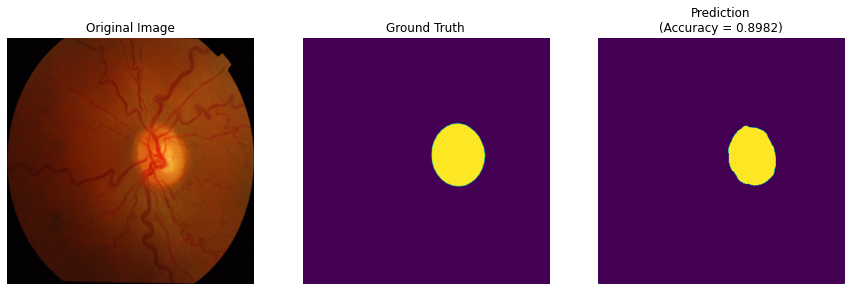

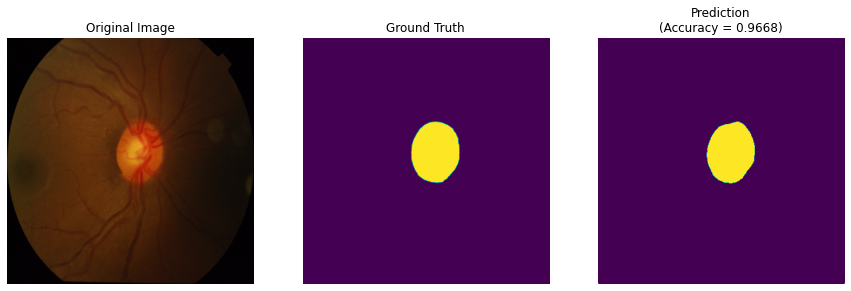

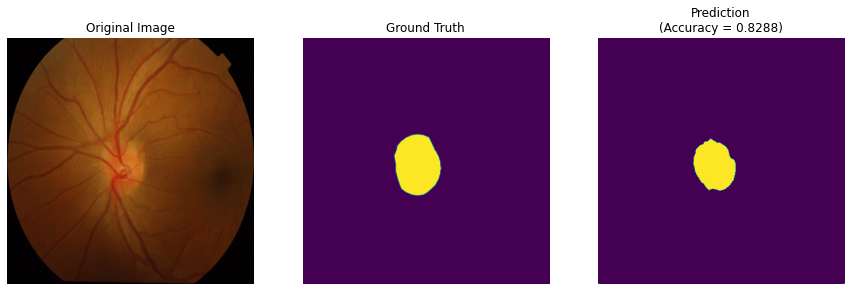

In [0]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import PIL
import numpy as np
import cv2
from PIL import Image

dice=[]
iou=[]
for i in range(1,52):
  original='/content/drive/My Drive/GD/Testing/Images/%d.png'%i
  mask='/content/drive/My Drive/GD/Testing/test od1/%d.png'%i
  predicted='/content/drive/My Drive/Colab_Project/pred_od/%d.png'%(i)

  image = PIL.Image.open(original)
  ns=(400,400)
  original = image.resize(ns)

  image = PIL.Image.open(mask)
  mask = image.resize(ns)


  
  image=PIL.Image.open(predicted)
  ap=np.asarray(image)
  aq=np.asarray(mask)

  c=0 #to count no of white pixels in mask
  for i in range(mask.size[0]):
    for j in range(mask.size[1]):
      if(aq[i][j] != 0):
        c=c+1

  d=0 #to count no of white pixels in predicted
  for i in range(mask.size[0]):
    for j in range(mask.size[1]):
      if(ap[i][j] != 0):
        d=d+1

  e=0 #to count no of white pixels in the over-lapping area
  for i in range(mask.size[0]):
    for j in range(mask.size[1]):
      if(aq[i][j] != 0 and ap[i][j]!=0):
        e=e+1

  acc=2*e/(c+d) #Sørensen–Dice coefficient for calculating the accuracy
  dice.append(acc)
  l=e/(c+d-e)
  iou.append(l)


  fig = plt.figure(figsize=(15, 15))
  a = fig.add_subplot(1, 3, 1)
  plt.imshow(np.asarray(original))
  plt.title("Original Image")
  plt.axis("off")
  plt.subplot(1, 3, 2)
  plt.imshow(np.asarray(mask))
  plt.title("Ground Truth")
  plt.axis("off")
  plt.subplot(1, 3, 3)
  plt.imshow(np.asarray(Image.open(predicted)))
  plt.title("Prediction\n(Accuracy = {:.4f})".format(acc))
  #plt.title("Prediction")
  plt.axis("off")



In [0]:
data_gen_args = dict()
myGene = trainGenerator(4,'/content/drive/My Drive/GD/Training','Images','Cup avg',data_gen_args,save_to_dir = None)
model = unet()
model_checkpoint = ModelCheckpoint('/content/drive/My Drive/Colab_Project/Weights/unet_membrane1_27rd.hdf5', monitor='loss',verbose=1, save_best_only=True)
model.fit_generator(myGene,steps_per_epoch=175,epochs=27,callbacks=[model_checkpoint])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:74: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("co...)`


Epoch 1/27
Found 700 images belonging to 1 classes.
Found 700 images belonging to 1 classes.
175/175 [==============================] - 417s 2s/step - loss: 0.6220 - accuracy: 0.9504

Epoch 00001: loss improved from inf to 0.62199, saving model to /content/drive/My Drive/Colab_Project/Weights/unet_membrane1_27rd.hdf5
Epoch 2/27
175/175 [==============================] - 409s 2s/step - loss: 0.5873 - accuracy: 0.9922

Epoch 00002: loss improved from 0.62199 to 0.58730, saving model to /content/drive/My Drive/Colab_Project/Weights/unet_membrane1_27rd.hdf5
Epoch 3/27
114/175 [==================>...........] - ETA: 2:22 - loss: 0.5670 - accuracy: 0.9945

KeyboardInterrupt: ignored

Testng is done here for the Cup.
1. Number of test data = 51

In [0]:
testGene = testGenerator("/content/drive/My Drive/GD/Testing/Images")
model = unet()
model.load_weights("/content/drive/My Drive/Colab_Project/Weights/unet_membrane1_27rd.hdf5")
results = model.predict_generator(testGene,51,verbose=1)
#predicted_image_binary = results > 0.5
saveResult("/content/drive/My Drive/Colab_Project/pred_cup",results)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:74: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("co...)`


51/51 [==============================] - 21s 405ms/step


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:130: UserWarning: /content/drive/My Drive/Colab_Project/pred_cup/4.png is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:130: UserWarning: /content/drive/My Drive/Colab_Project/pred_cup/6.png is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:130: UserWarning: /content/drive/My Drive/Colab_Project/pred_cup/8.png is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:130: UserWarning: /content/drive/My Drive/Colab_Project/pred_cup/13.png is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:130: UserWarning: /content/drive/My Drive/Colab_Project/pred_cup/21.png is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:130: UserWarning: /content/drive/My Drive/Colab_Project/pred_cup/23.png is a low contrast image
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:

Original data, Ground truth and the Predicted value of the Cup are displayed side-wise for comparison.









/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


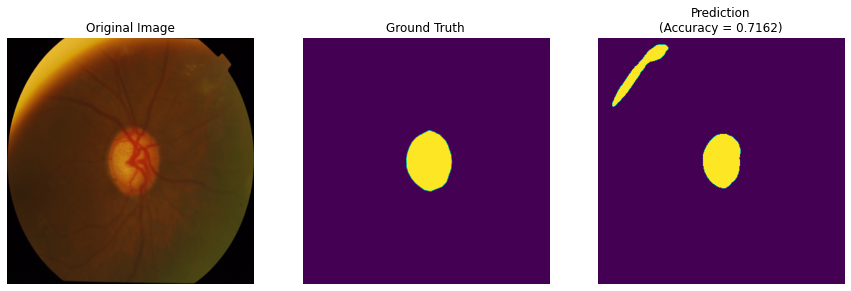

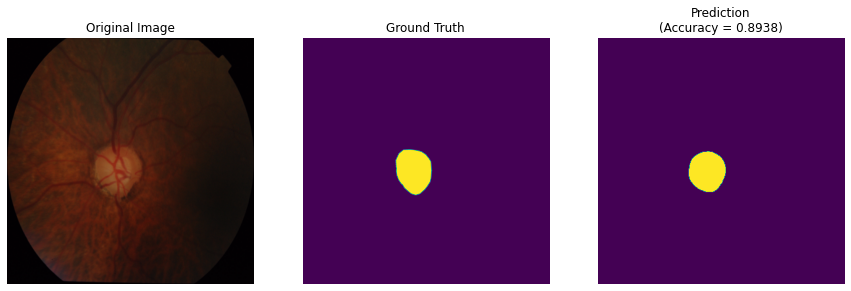

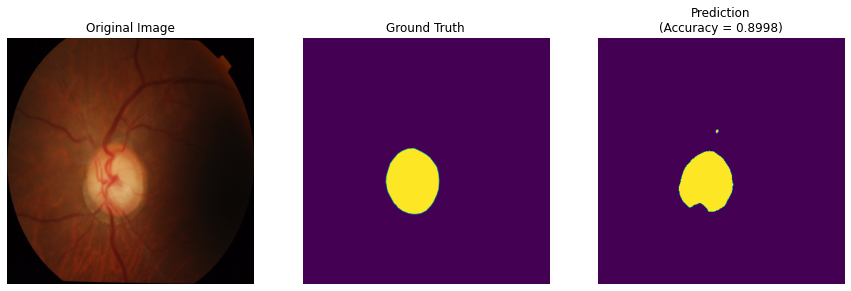

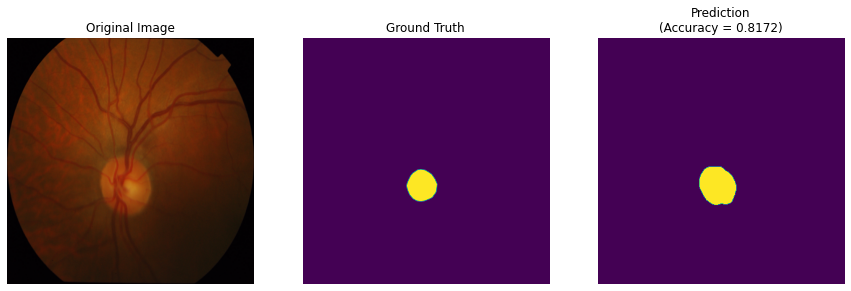

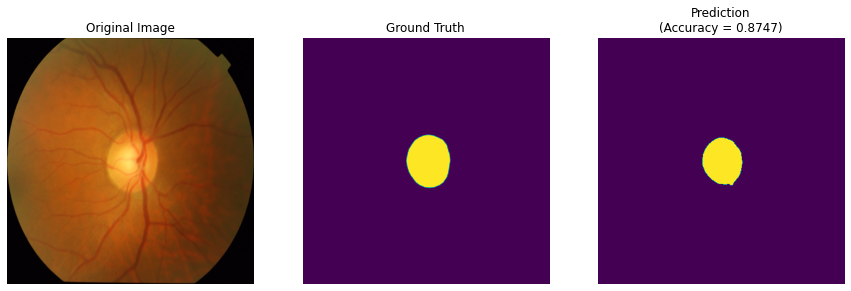

...

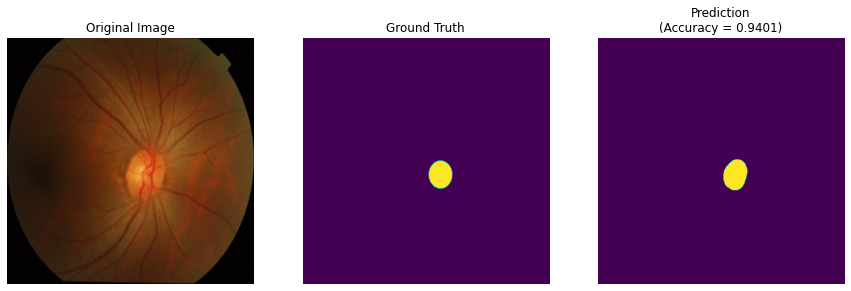

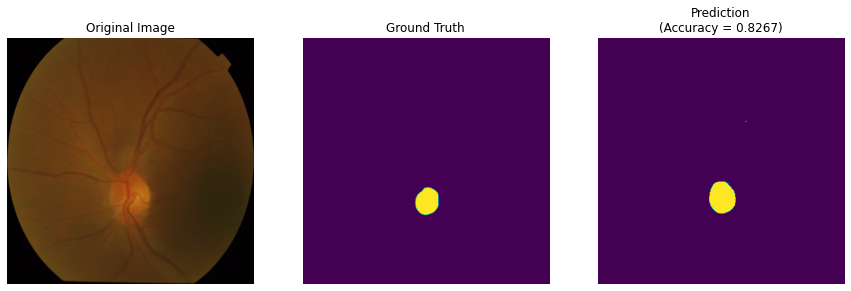

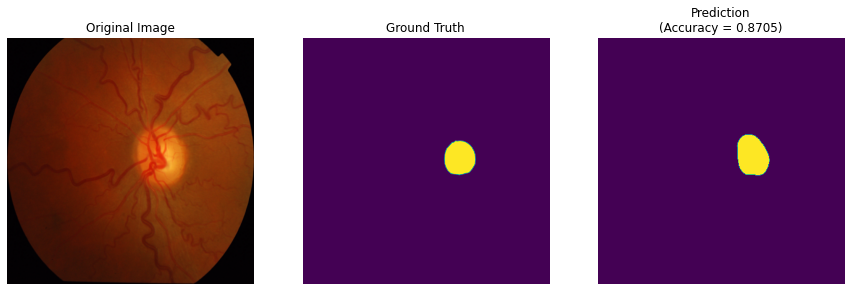

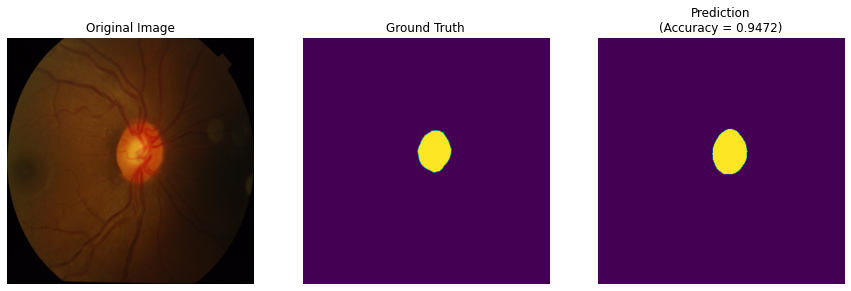

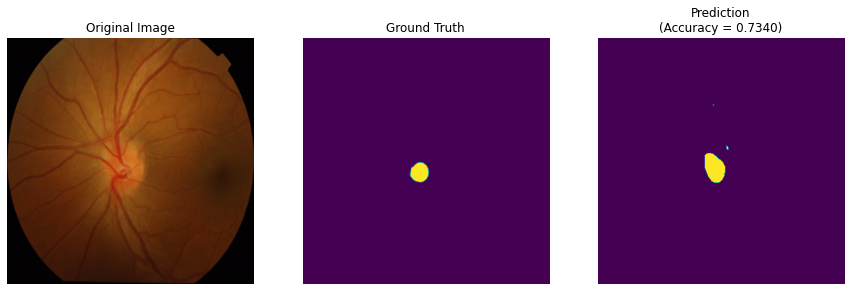

In [18]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import PIL
import numpy as np
import cv2
from PIL import Image

iou1=[]
dice1=[]
for i in range(1,52):
  original='/content/drive/My Drive/GD/Testing/Images/%d.png'%i
  mask='/content/drive/My Drive/GD/Testing/test cup1/%d.png'%i
  predicted='/content/drive/My Drive/GD/Testing/pred_cup/%d.png'%(i)

  image = PIL.Image.open(original)
  ns=(400,400)
  original = image.resize(ns)

  image = PIL.Image.open(mask)
  mask = image.resize(ns)

  image=PIL.Image.open(predicted)
  ap=np.asarray(image)
  aq=np.asarray(mask)

  c=0 #to count no of white pixels in mask
  for i in range(mask.size[0]):
    for j in range(mask.size[1]):
      if(aq[i][j] != 0):
        c=c+1

  d=0 #to count no of white pixels in predicted
  for i in range(mask.size[0]):
    for j in range(mask.size[1]):
      if(ap[i][j] != 0):
        d=d+1

  e=0 #to count no of white pixels in the over-lapping area
  for i in range(mask.size[0]):
    for j in range(mask.size[1]):
      if(aq[i][j] != 0 and ap[i][j]!=0):
        e=e+1

  acc=2*e/(c+d) #Sørensen–Dice coefficient for calculating the accuracy
  dice1.append(acc)
  l=e/(c+d-e)
  iou1.append(l)

  fig = plt.figure(figsize=(15, 15))
  a = fig.add_subplot(1, 3, 1)
  plt.imshow(np.asarray(original))
  plt.title("Original Image")
  plt.axis("off")
  plt.subplot(1, 3, 2)
  plt.imshow(np.asarray(mask))
  plt.title("Ground Truth")
  plt.axis("off")
  plt.subplot(1, 3, 3)
  plt.imshow(np.asarray(Image.open(predicted)))
  plt.title("Prediction\n(Accuracy = {:.4f})".format(acc))
  #plt.title("Prediction")
  plt.axis("off")



Calculating and printing accuracy.

In [19]:
import cv2
import numpy as np
import os

od=[]
for i in range(51):
        img = cv2.imread(os.path.join('/content/drive/My Drive/GD/Testing/pred_od',"%d.png"%(i+1)),cv2.IMREAD_GRAYSCALE)
        n_white_pix = np.sum(img == 255)
        od.append(n_white_pix)

cup=[]
for i in range(51):
        img = cv2.imread(os.path.join('/content/drive/My Drive/GD/Testing/pred_cup',"%d.png"%(i+1)),cv2.IMREAD_GRAYSCALE)
        n_white_pix = np.sum(img == 255)
        cup.append(n_white_pix)

ratio=np.divide(cup,od)
a111=[]
for i in range(51):
  if ratio[i] <=0.47:
    a111.append(0)
  else:
    a111.append(1)
z=[1,1,1,1,0,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0]
c=0
for i in range(51):
  if a111[i]==z[i]:
    c=c+1
    
accu=(c/51)*100
print(accu)
print(c)

88.23529411764706
45


Calculating and printing Dice for OD and Cup, IoU for OD and Cup, Precision, Recall, F1 Score, Sensitivity, Specifity.

In [20]:
d=np.sum(dice)/51
d1=np.sum(dice1)/51
u=np.sum(iou)/51
u1=np.sum(iou1)/51

tp=0
tn=0
fp=0
fn=0
for i in range(51):
  if(z[i]==1):
    if(a111[i]==1):
      tp=tp+1
    else:
      fn=fn+1
  else:
    if(a111[i]==1):
      fp=fp+1
    else:
      tn=tn+1

precision = tp/(tp+fp)
recall = tp/(tp+fn)
f1=2*recall*precision/(recall+precision)

sensitivity = tp/(tp+fn)
specifity = tn/(tn+fp)


print("Dice for OD = {:.4f}".format(d))
print("Dice for Cup = {:.4f}".format(d1))
print("IoU for OD = {:.4f}".format(u))
print("IoU for Cup = {:.4f}".format(u1))
print("Precision = {:.4f}".format(precision))
print("Recall = {:.4f}".format(recall))
print("F1 Score = {:.4f}".format(f1))
print("Sensitivity = {:.4f}".format(sensitivity))
print("Specifity = {:.4f}".format(specifity))

Dice for OD = 0.9252
Dice for Cup = 0.8719
IoU for OD = 0.8647
IoU for Cup = 0.7774
Precision = 0.9000
Recall = 0.9474
F1 Score = 0.9231
Sensitivity = 0.9474
Specifity = 0.6923


Calculating highest Disk and IoU for OD.

In [0]:
hdo=0
for i in range(51):
  if(dice[i]>hdo):
    hdo=dice[i]
    phdo=i

hdc=0
for i in range(51):
  if(dice1[i]>hdc):
    hdc=dice1[i]
    phdc=i



Printing highest Disk and IoU for OD.

Best Case for OD
Dice = 0.98
IoU = 0.96


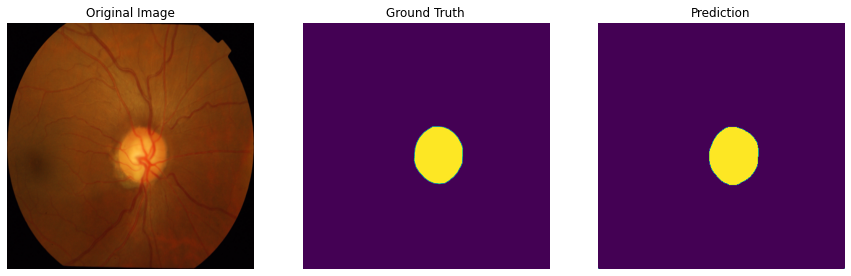

In [22]:
original='/content/drive/My Drive/GD/Testing/Images/%d.png'%(phdo+1)
mask='/content/drive/My Drive/GD/Testing/test od1/%d.png'%(phdo+1)
predicted='/content/drive/My Drive/GD/Testing/pred_od/%d.png'%(phdo+1)

image = PIL.Image.open(original)
ns=(400,400)
original = image.resize(ns)

image = PIL.Image.open(mask)
mask = image.resize(ns)


fig = plt.figure(figsize=(15, 15))
a = fig.add_subplot(1, 3, 1)
plt.imshow(np.asarray(original))
plt.title("Original Image")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(np.asarray(mask))
plt.title("Ground Truth")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(np.asarray(Image.open(predicted)))
plt.title("Prediction")
plt.axis("off")

print("Best Case for OD\nDice = {:.2f}".format(dice[phdo]))
print("IoU = {:.2f}".format(iou[phdo]))

Printing highest Disk and IoU for Cup.

Best Case for Cup
Dice = 0.96
IoU = 0.92


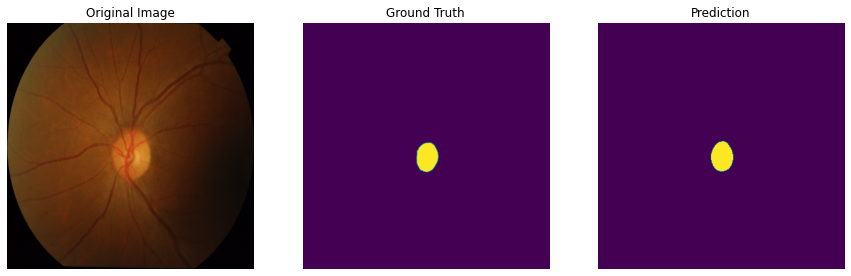

In [23]:
original='/content/drive/My Drive/GD/Testing/Images/%d.png'%(phdc+1)
mask='/content/drive/My Drive/GD/Testing/test cup1/%d.png'%(phdc+1)
predicted='/content/drive/My Drive/GD/Testing/pred_cup/%d.png'%(phdc+1)

image = PIL.Image.open(original)
ns=(400,400)
original = image.resize(ns)

image = PIL.Image.open(mask)
mask = image.resize(ns)


fig = plt.figure(figsize=(15, 15))
a = fig.add_subplot(1, 3, 1)
plt.imshow(np.asarray(original))
plt.title("Original Image")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(np.asarray(mask))
plt.title("Ground Truth")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(np.asarray(Image.open(predicted)))
plt.title("Prediction")
plt.axis("off")

print("Best Case for Cup\nDice = {:.2f}".format(dice1[phdc]))
print("IoU = {:.2f}".format(iou1[phdc]))

Model summary.

In [24]:
model=unet()
model.summary()

Model: "model_14"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_14 (InputLayer)           (None, 400, 400, 1)  0                                            
__________________________________________________________________________________________________
conv2d_313 (Conv2D)             (None, 400, 400, 64) 640         input_14[0][0]                   
__________________________________________________________________________________________________
batch_normalization_248 (BatchN (None, 400, 400, 64) 256         conv2d_313[0][0]                 
__________________________________________________________________________________________________
conv2d_314 (Conv2D)             (None, 400, 400, 64) 36928       batch_normalization_248[0][0]    
___________________________________________________________________________________________

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:74: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("co...)`
